Reading Data

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
from glob import iglob
import anndata
import os
import sklearn
from sklearn.linear_model import LogisticRegression
import pickle
import scipy
import matplotlib as mpl
import matplotlib.pyplot as plt
np.random.seed(0)
sc.settings.verbosity = 3
sc.logging.print_versions()
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sc.settings.set_figure_params(dpi = 300)

-----
anndata     0.7.5
scanpy      1.7.0
sinfo       0.3.1
-----
PIL                 8.1.0
anndata             0.7.5
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.4
chardet             3.0.4
cloudpickle         1.6.0
colorama            0.4.4
constants           NA
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.02.0
dateutil            2.8.1
decorator           4.4.2
get_version         2.1
h5py                3.1.0
highs_wrapper       NA
idna                2.10
igraph              0.8.3
ipykernel           5.4.2
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.17.2
jinja2              2.11.2
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.2.2
jupyterlab_server   2.1.3
kiwisolver          1.3.1
leg

In [2]:
save_path = '/lustre/scratch117/cellgen/team292/ab55/'

In [3]:
adata_test = anndata.read_h5ad(save_path + "N3-pbmc-filtered.h5ad")
adata_test

AnnData object with n_obs × n_vars = 97499 × 22572
    obs: 'souporcell', 'demultiplexed', 'sample_names', 'log2p1_count', 'percent_mito', 'n_genes', 'batch', 'FolderName', 'Lane', 'Sort', 'Type', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'scrublet_pred', 'scrublet_local_pred', 'scrublet_score', 'scrublet_cluster_score', 'filtered_cells', 'S_score', 'G2M_score', 'phase', 'leiden_sampl_cc', 'leidenres2_sampl_cc', 'DonorSubset', 'leiden_scvi_subset_cc', 'leidenres2_scvi_subset_cc', 'leiden_tvi_subset_cc', 'leidenres2_tvi_subset_cc', 'louvain'
    var: 'gene_ids', 'feature_types', 'n_cells'
    uns: 'b

In [4]:
adata_test.obs

,souporcell,demultiplexed,sample_names,log2p1_count,percent_mito,n_genes,batch,FolderName,Lane,Sort,...,G2M_score,phase,leiden_sampl_cc,leidenres2_sampl_cc,DonorSubset,leiden_scvi_subset_cc,leidenres2_scvi_subset_cc,leiden_tvi_subset_cc,leidenres2_tvi_subset_cc,louvain
RV8919578_AAACCTGAGAAACCTA-1,singlet,CV19-I-O-3,RV8919578,11.406736,0.017318,1159,2,I-O-2_3_C-0,34527_1,None,...,-0.135531,S,9,13,True,2,10,15,23,18
RV8919578_AAACCTGAGAGCAATT-1,singlet,CV19-I-O-3,RV8919578,12.939213,0.026614,2058,2,I-O-2_3_C-0,34527_1,None,...,-0.425458,S,4,7,True,6,5,7,4,5
RV8919578_AAACCTGAGAGCTGGT-1,singlet,CV19-I-O-2,RV8919578,13.342491,0.007992,2597,2,I-O-2_3_C-0,34527_1,None,...,-0.636630,G1,29,46,True,18,43,30,50,55
RV8919578_AAACCTGAGCGAAGGG-1,singlet,CV19-I-O-3,RV8919578,12.463013,0.031887,1902,2,I-O-2_3_C-0,34527_1,None,...,-0.310989,G1,5,2,True,2,3,4,3,9
RV8919578_AAACCTGAGCGATGAC-1,singlet,CV19-I-O-2,RV8919578,11.874598,0.034896,882,2,I-O-2_3_C-0,34527_1,None,...,-0.328388,S,9,13,True,5,10,15,23,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RV8959686_TTTGTCAGTATGAATG-1,singlet,CV19-I-O-71,RV8959686,11.049168,0.131728,689,24,I-O-71_C-0,38186,None,...,-0.051832,G1,9,22,True,3,2,5,13,8
RV8959686_TTTGTCAGTCGGCATC-1,singlet,CV19-I-O-71,RV8959686,11.604091,0.026028,1058,24,I-O-71_C-0,38186,None,...,-0.106410,S,28,33,True,13,25,21,27,30
RV8959686_TTTGTCAGTGACAAAT-1,singlet,CV19-I-O-71,RV8959686,11.200898,0.064173,792,24,I-O-71_C-0,38186,None,...,-0.097253,G1,9,13,True,3,2,15,23,18
RV8959686_TTTGTCAGTTGCCTCT-1,singlet,CV19-I-O-71,RV8959686,12.747355,0.008582,1535,24,I-O-71_C-0,38186,None,...,-0.428205,G1,7,6,True,1,9,2,6,26


In [5]:
# load reference PBMCs COVID-19 dataset (Stephenson, E. et al, Nature Medicine, 2021) from which annotations will be initially transferred
adata_train = anndata.read_h5ad(save_path + 'haniffa21_processed_raw.h5ad')
adata_train

AnnData object with n_obs × n_vars = 691683 × 31279
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Resample', 'Collection_Day', 'Sex', 'Age', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'initial_clustering', 'full_clustering'
    var: 'feature_types'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'

In [6]:
adata_train.obs

,sample_id,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,Resample,Collection_Day,Sex,...,Smoker,Status_on_day_collection,Status_on_day_collection_summary,Days_from_onset,Site,time_after_LPS,Worst_Clinical_Status,Outcome,initial_clustering,full_clustering
BGCV01_AAACCTGAGACCGGAT-1,BGCV01_CV0902,2457.0,2457.0,8275.0,387.0,4.676737,32,Initial,D0,Male,...,Not_known,Healthy,Healthy,Healthy,Cambridge,nan,Healthy,Home,MAIT,MAIT
BGCV01_AAACCTGAGATGCGAC-1,BGCV01_CV0904,1986.0,1986.0,10695.0,499.0,4.665731,11,Initial,D0,Female,...,Not_known,Healthy,Healthy,Healthy,Cambridge,nan,Healthy,Home,B_cell,B_non-switched_memory
BGCV01_AAACCTGAGCGCCTCA-1,BGCV01_CV0904,1341.0,1341.0,4825.0,179.0,3.709845,19,Initial,D0,Female,...,Not_known,Healthy,Healthy,Healthy,Cambridge,nan,Healthy,Home,CD4,CD4.CM
BGCV01_AAACCTGAGCGTGAAC-1,BGCV01_CV0025,1579.0,1579.0,4671.0,61.0,1.305930,1,Initial,D0,Male,...,Non-smoker,Ward_O2,Moderate,16,Cambridge,nan,Moderate,Home,CD8,CD8.TE
BGCV01_AAACCTGAGCTTATCG-1,BGCV01_CV0904,1466.0,1466.0,3776.0,196.0,5.190678,16,Initial,D0,Female,...,Not_known,Healthy,Healthy,Healthy,Cambridge,nan,Healthy,Home,NK_16hi,NK_16hi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCAATACCG-MH8919282,MH8919282,1784.0,1784.0,6312.0,329.0,5.212294,8,Initial,D0,Female,...,Not_known,Healthy,Healthy,Healthy,Ncl,nan,Healthy,Home,CD8,CD8.Naive
TTTGTCATCAGCTGGC-MH8919282,MH8919282,1576.0,1576.0,5272.0,161.0,3.053869,9,Initial,D0,Female,...,Not_known,Healthy,Healthy,Healthy,Ncl,nan,Healthy,Home,CD4,CD4.Naive
TTTGTCATCCCTAACC-MH8919282,MH8919282,1700.0,1700.0,4400.0,343.0,7.795455,0,Initial,D0,Female,...,Not_known,Healthy,Healthy,Healthy,Ncl,nan,Healthy,Home,NK_16hi,NK_16hi
TTTGTCATCGTACCGG-MH8919282,MH8919282,1493.0,1493.0,4481.0,154.0,3.436733,24,Initial,D0,Female,...,Not_known,Healthy,Healthy,Healthy,Ncl,nan,Healthy,Home,Treg,MAIT


Processing Data

In [7]:
# get raw data back
adata_test = anndata.AnnData(X = adata_test.raw.X, obs = adata_test.obs, var = adata_test.raw.var, obsm = adata_test.obsm).copy()
adata_test

AnnData object with n_obs × n_vars = 97499 × 33759
    obs: 'souporcell', 'demultiplexed', 'sample_names', 'log2p1_count', 'percent_mito', 'n_genes', 'batch', 'FolderName', 'Lane', 'Sort', 'Type', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'scrublet_pred', 'scrublet_local_pred', 'scrublet_score', 'scrublet_cluster_score', 'filtered_cells', 'S_score', 'G2M_score', 'phase', 'leiden_sampl_cc', 'leidenres2_sampl_cc', 'DonorSubset', 'leiden_scvi_subset_cc', 'leidenres2_scvi_subset_cc', 'leiden_tvi_subset_cc', 'leidenres2_tvi_subset_cc', 'louvain'
    var: 'gene_ids', 'feature_types', 'n_cells'
    obsm: '

In [8]:
np.unique(adata_test.var["feature_types"])

array(['Antibody Capture', 'Gene Expression'], dtype=object)

In [9]:
# only use gene expression to transfer annotations
adata_test = adata_test[:, adata_test.var["feature_types"] != "Antibody Capture"].copy()
adata_test

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


AnnData object with n_obs × n_vars = 97499 × 33567
    obs: 'souporcell', 'demultiplexed', 'sample_names', 'log2p1_count', 'percent_mito', 'n_genes', 'batch', 'FolderName', 'Lane', 'Sort', 'Type', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'scrublet_pred', 'scrublet_local_pred', 'scrublet_score', 'scrublet_cluster_score', 'filtered_cells', 'S_score', 'G2M_score', 'phase', 'leiden_sampl_cc', 'leidenres2_sampl_cc', 'DonorSubset', 'leiden_scvi_subset_cc', 'leidenres2_scvi_subset_cc', 'leiden_tvi_subset_cc', 'leidenres2_tvi_subset_cc', 'louvain'
    var: 'gene_ids', 'feature_types', 'n_cells'
    obsm: '

In [10]:
np.unique(adata_test.var["feature_types"])

array(['Gene Expression'], dtype=object)

In [12]:
# process counts and filter
sc.pp.normalize_per_cell(adata_test, counts_per_cell_after = 1e4)
sc.pp.log1p(adata_test)

normalizing by total count per cell
    finished (0:00:01): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [11]:
sc.pp.filter_genes(adata_test, min_cells = 3)

filtered out 11187 genes that are detected in less than 3 cells


In [13]:
adata_test

AnnData object with n_obs × n_vars = 97499 × 22380
    obs: 'souporcell', 'demultiplexed', 'sample_names', 'log2p1_count', 'percent_mito', 'n_genes', 'batch', 'FolderName', 'Lane', 'Sort', 'Type', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'scrublet_pred', 'scrublet_local_pred', 'scrublet_score', 'scrublet_cluster_score', 'filtered_cells', 'S_score', 'G2M_score', 'phase', 'leiden_sampl_cc', 'leidenres2_sampl_cc', 'DonorSubset', 'leiden_scvi_subset_cc', 'leidenres2_scvi_subset_cc', 'leiden_tvi_subset_cc', 'leidenres2_tvi_subset_cc', 'louvain', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells'

In [14]:
# similarly process counts and filter for training dataset
adata_train = anndata.AnnData(X = adata_train.raw.X, obs = adata_train.obs, var = adata_train.raw.var, obsm = adata_train.obsm).copy()
adata_train

AnnData object with n_obs × n_vars = 691683 × 31087
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Resample', 'Collection_Day', 'Sex', 'Age', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'initial_clustering', 'full_clustering'
    var: 'feature_types'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'

In [15]:
np.unique(adata_train.var["feature_types"])

array(['Gene Expression'], dtype=object)

In [16]:
sc.pp.filter_cells(adata_train, min_genes = 200)

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [18]:
sc.pp.normalize_per_cell(adata_train, counts_per_cell_after = 1e4)
sc.pp.log1p(adata_train)

normalizing by total count per cell
    finished (0:00:09): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [17]:
sc.pp.filter_genes(adata_train, min_cells = 3)

filtered out 6748 genes that are detected in less than 3 cells


In [19]:
adata_train

AnnData object with n_obs × n_vars = 691683 × 24339
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Resample', 'Collection_Day', 'Sex', 'Age', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'initial_clustering', 'full_clustering', 'n_counts'
    var: 'feature_types', 'n_cells'
    uns: 'log1p'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'

In [20]:
np.unique(adata_train.obs["initial_clustering"], return_counts=True)

(array(['B_cell', 'CD14', 'CD16', 'CD4', 'CD8', 'DCs', 'HSC',
        'Lymph_prolif', 'MAIT', 'Mono_prolif', 'NK_16hi', 'NK_56hi',
        'Plasmablast', 'Platelets', 'RBC', 'Treg', 'gdT', 'pDC'],
       dtype=object),
 array([ 66450, 146484,  18041, 145592, 102205,   7895,   3708,   7415,
          9026,    712,  85319,  29722,  12243,  17017,   2614,  16314,
         15753,   5173]))

In [21]:
np.unique(adata_train.obs["full_clustering"], return_counts=True)

(array(['ASDC', 'B_exhausted', 'B_immature', 'B_malignant', 'B_naive',
        'B_non-switched_memory', 'B_switched_memory', 'C1_CD16_mono',
        'CD14_mono', 'CD16_mono', 'CD4.CM', 'CD4.EM', 'CD4.IL22',
        'CD4.Naive', 'CD4.Prolif', 'CD4.Tfh', 'CD4.Th1', 'CD4.Th17',
        'CD4.Th2', 'CD8.EM', 'CD8.Naive', 'CD8.Prolif', 'CD8.TE',
        'CD83_CD14_mono', 'DC1', 'DC2', 'DC3', 'DC_prolif', 'HSC',
        'ILC1_3', 'ILC2', 'MAIT', 'Mono_prolif', 'NKT', 'NK_16hi',
        'NK_56hi', 'NK_prolif', 'Plasma_cell_IgA', 'Plasma_cell_IgG',
        'Plasma_cell_IgM', 'Plasmablast', 'Platelets', 'RBC', 'Treg',
        'gdT', 'pDC'], dtype=object),
 array([  110,  3179,  5707,  2313, 43524,  2858,  7131,   251, 75072,
        19686, 50022,  2641, 18409, 63141,   624, 13638,   486,    13,
           55, 18974, 31256,  1360, 53560, 69497,   434,  3617,  3828,
          124,  3672,   815,    98, 13432,   712,  5061, 83874, 26858,
         4974,  2812,  3596,   805,  6752, 15073,  2211,  3908

Predicting w/ HVGs

extracting highly variable genes
    finished (0:00:20)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


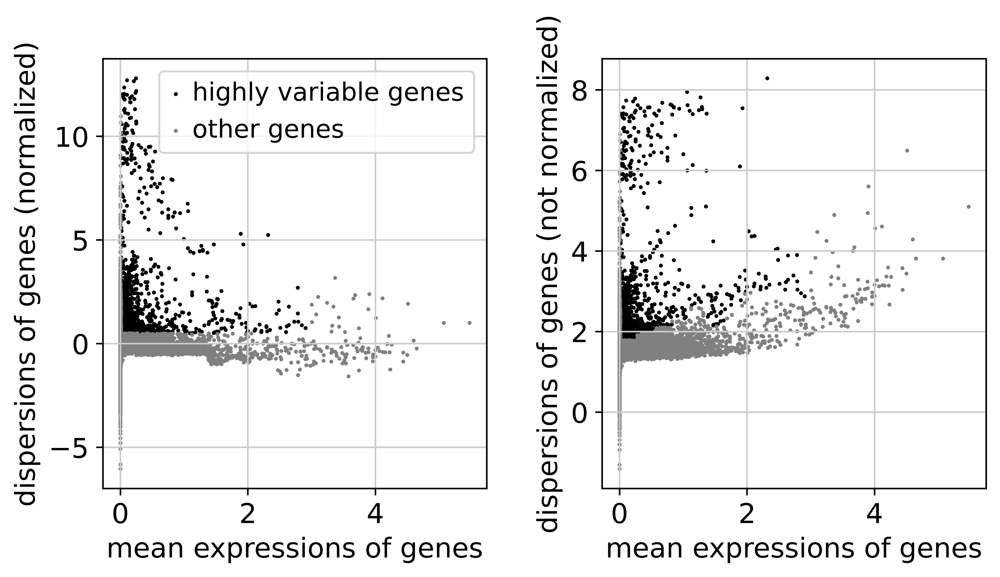

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


View of AnnData object with n_obs × n_vars = 691683 × 1052
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Resample', 'Collection_Day', 'Sex', 'Age', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'initial_clustering', 'full_clustering', 'n_counts'
    var: 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'

In [22]:
# select highly variable genes
sc.pp.highly_variable_genes(adata_train, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
sc.pl.highly_variable_genes(adata_train)
adata_train_hvg = adata_train[:, adata_train.var['highly_variable']]
adata_train_hvg

In [23]:
# subset to shared genes between datasets only
common_genes_hvg = sorted(list(set(adata_train_hvg.var_names) & set(adata_test.var_names)))
print(len(common_genes_hvg),"genes are shared between training (hvg) and test datasets \n",
      len(set(adata_train_hvg.var_names)), 'genes in training (hvg) dataset \n',
      len((set(adata_test.var_names))), 'genes in test dataset \n')

1050 genes are shared between training (hvg) and test datasets 
 1052 genes in training (hvg) dataset 
 22380 genes in test dataset 



In [24]:
adata_test.var_names

Index(['AL627309.1', 'AL627309.3', 'AL627309.2', 'AL669831.2', 'AL669831.5',
       'FAM87B', 'LINC00115', 'FAM41C', 'AL645608.7', 'AL645608.3',
       ...
       'AC145212.1', 'MAFIP', 'AC011043.1', 'AL592183.1', 'AC007325.4',
       'AL354822.1', 'AC004556.1', 'AC233755.2', 'AC233755.1', 'AC240274.1'],
      dtype='object', length=22380)

In [25]:
adata_test_shared_hvg = adata_test[:,common_genes_hvg]
adata_test_shared_hvg.var_names

Index(['A2M-AS1', 'AATK', 'ABCA1', 'ABCB6', 'ABCC3', 'ABCC4', 'ABHD4',
       'ABLIM3', 'ABO', 'AC007262.2',
       ...
       'YWHAH', 'Z93241.1', 'ZC3HAV1L', 'ZFAT', 'ZFP36', 'ZGLP1', 'ZNF185',
       'ZNF683', 'ZNF778', 'ZNF841'],
      dtype='object', length=1050)

In [26]:
adata_train_hvg.var_names

Index(['ISG15', 'TNFRSF18', 'TNFRSF4', 'SMIM1', 'RBP7', 'AL109811.2', 'PADI4',
       'C1QA', 'C1QB', 'ID3',
       ...
       'TYMP', 'APP', 'ADAMTS1', 'MAP3K7CL', 'AIRE', 'COL6A2', 'C21orf58',
       'S100B', 'AC233755.2', 'AC233755.1'],
      dtype='object', name='names', length=1052)

In [27]:
adata_train_shared_hvg = adata_train_hvg[:,common_genes_hvg]
adata_train_shared_hvg.var_names

Index(['A2M-AS1', 'AATK', 'ABCA1', 'ABCB6', 'ABCC3', 'ABCC4', 'ABHD4',
       'ABLIM3', 'ABO', 'AC007262.2',
       ...
       'YWHAH', 'Z93241.1', 'ZC3HAV1L', 'ZFAT', 'ZFP36', 'ZGLP1', 'ZNF185',
       'ZNF683', 'ZNF778', 'ZNF841'],
      dtype='object', name='names', length=1050)

In [28]:
list(adata_test_shared_hvg.var_names) == list(adata_train_shared_hvg.var_names)

True

In [29]:
adata_test_shared_hvg.shape

(97499, 1050)

In [30]:
adata_train_shared_hvg.shape

(691683, 1050)

In [31]:
Annotations = adata_train_shared_hvg.obs['full_clustering']

In [32]:
%%time
logisticRegr = LogisticRegression(max_iter = 10000, n_jobs = -1, random_state = 0, C = 0.2)
logisticRegr.fit(adata_train_shared_hvg.X, Annotations)

CPU times: user 5.68 s, sys: 1.04 s, total: 6.72 s
Wall time: 4h 24min 14s


LogisticRegression(C=0.2, max_iter=10000, n_jobs=-1, random_state=0)

In [33]:
# save model results
pkl_filename = "logisreg.pkl"  
with open(pkl_filename, 'wb') as file:  
    pickle.dump(logisticRegr, file)

In [34]:
# add results to the object and plot
Predictions = logisticRegr.predict(adata_test_shared_hvg.X)
adata_test_shared_hvg.obs['Celltype_Predictions'] = Predictions

Trying to set attribute `.obs` of view, copying.


In [35]:
Probabilities = logisticRegr.predict_proba(adata_test_shared_hvg.X)
probs_adata = []
for i,clus in enumerate(adata_test_shared_hvg.obs['Celltype_Predictions']):
    probs_adata.append(Probabilities[i,logisticRegr.classes_==clus][0])
adata_test_shared_hvg.obs['Prediction_Probabilities'] = probs_adata

In [36]:
adata_test_shared_hvg.obs

,souporcell,demultiplexed,sample_names,log2p1_count,percent_mito,n_genes,batch,FolderName,Lane,Sort,...,leidenres2_sampl_cc,DonorSubset,leiden_scvi_subset_cc,leidenres2_scvi_subset_cc,leiden_tvi_subset_cc,leidenres2_tvi_subset_cc,louvain,n_counts,Celltype_Predictions,Prediction_Probabilities
RV8919578_AAACCTGAGAAACCTA-1,singlet,CV19-I-O-3,RV8919578,11.406736,0.017318,1159,2,I-O-2_3_C-0,34527_1,None,...,13,True,2,10,15,23,18,1612.0,NK_56hi,0.875073
RV8919578_AAACCTGAGAGCAATT-1,singlet,CV19-I-O-3,RV8919578,12.939213,0.026614,2058,2,I-O-2_3_C-0,34527_1,None,...,7,True,6,5,7,4,5,5856.0,B_naive,0.923932
RV8919578_AAACCTGAGAGCTGGT-1,singlet,CV19-I-O-2,RV8919578,13.342491,0.007992,2597,2,I-O-2_3_C-0,34527_1,None,...,46,True,18,43,30,50,55,8384.0,pDC,0.999873
RV8919578_AAACCTGAGCGAAGGG-1,singlet,CV19-I-O-3,RV8919578,12.463013,0.031887,1902,2,I-O-2_3_C-0,34527_1,None,...,2,True,2,3,4,3,9,4209.0,NK_16hi,0.720685
RV8919578_AAACCTGAGCGATGAC-1,singlet,CV19-I-O-2,RV8919578,11.874598,0.034896,882,2,I-O-2_3_C-0,34527_1,None,...,13,True,5,10,15,23,18,1105.0,NK_56hi,0.494041
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RV8959686_TTTGTCAGTATGAATG-1,singlet,CV19-I-O-71,RV8959686,11.049168,0.131728,689,24,I-O-71_C-0,38186,None,...,22,True,3,2,5,13,8,951.0,CD4.Naive,0.365491
RV8959686_TTTGTCAGTCGGCATC-1,singlet,CV19-I-O-71,RV8959686,11.604091,0.026028,1058,24,I-O-71_C-0,38186,None,...,33,True,13,25,21,27,30,1489.0,B_naive,0.889975
RV8959686_TTTGTCAGTGACAAAT-1,singlet,CV19-I-O-71,RV8959686,11.200898,0.064173,792,24,I-O-71_C-0,38186,None,...,13,True,3,2,15,23,18,1090.0,gdT,0.683505
RV8959686_TTTGTCAGTTGCCTCT-1,singlet,CV19-I-O-71,RV8959686,12.747355,0.008582,1535,24,I-O-71_C-0,38186,None,...,6,True,1,9,2,6,26,4349.0,CD4.IL22,0.884757


... storing 'Celltype_Predictions' as categorical


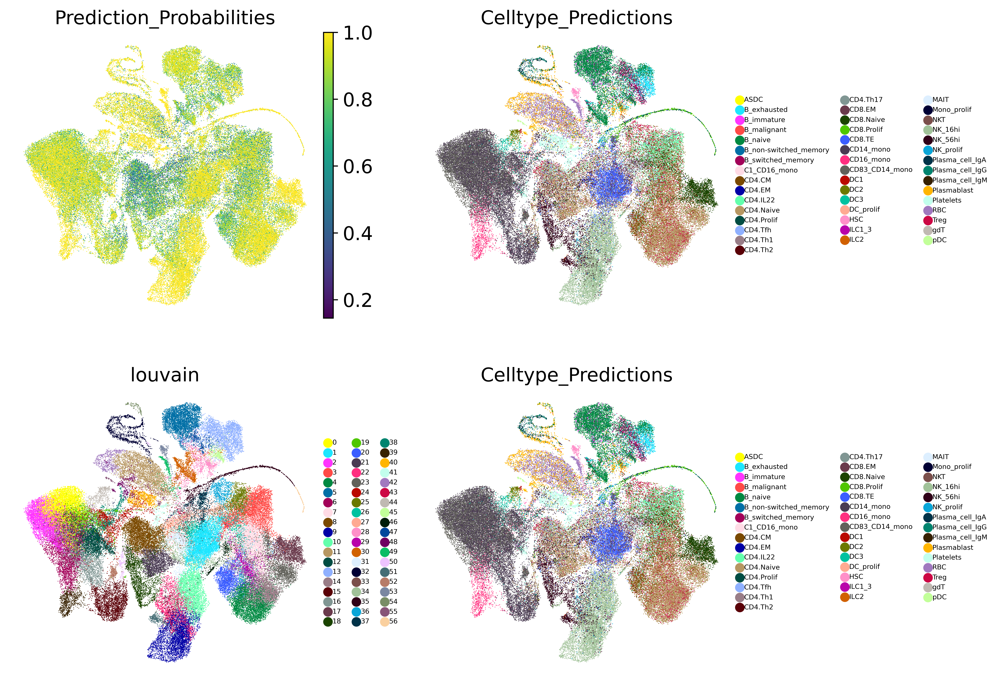

In [22]:
sc.pl.umap(adata_test_shared_hvg, color = ["Prediction_Probabilities", "Celltype_Predictions", "louvain", "Celltype_Predictions"], legend_fontsize = 5, frameon = False, ncols=2)

Saving Data

In [39]:
# table to be added to the original h5ad object
table_predictions = adata_test_shared_hvg.obs.loc[:, ['Celltype_Predictions', 'Prediction_Probabilities']]
table_predictions.to_csv("./table_celltype_predictions_hvg_from_haniffalab.csv")
table_predictions

,Celltype_Predictions,Prediction_Probabilities
RV8919578_AAACCTGAGAAACCTA-1,NK_56hi,0.875073
RV8919578_AAACCTGAGAGCAATT-1,B_naive,0.923932
RV8919578_AAACCTGAGAGCTGGT-1,pDC,0.999873
RV8919578_AAACCTGAGCGAAGGG-1,NK_16hi,0.720685
RV8919578_AAACCTGAGCGATGAC-1,NK_56hi,0.494041
...,...,...
RV8959686_TTTGTCAGTATGAATG-1,CD4.Naive,0.365491
RV8959686_TTTGTCAGTCGGCATC-1,B_naive,0.889975
RV8959686_TTTGTCAGTGACAAAT-1,gdT,0.683505
RV8959686_TTTGTCAGTTGCCTCT-1,CD4.IL22,0.884757


In [40]:
np.unique(table_predictions['Celltype_Predictions'], return_counts = True)

(array(['ASDC', 'B_exhausted', 'B_immature', 'B_malignant', 'B_naive',
        'B_non-switched_memory', 'B_switched_memory', 'C1_CD16_mono',
        'CD14_mono', 'CD16_mono', 'CD4.CM', 'CD4.EM', 'CD4.IL22',
        'CD4.Naive', 'CD4.Prolif', 'CD4.Tfh', 'CD4.Th1', 'CD4.Th2',
        'CD8.EM', 'CD8.Naive', 'CD8.Prolif', 'CD8.TE', 'CD83_CD14_mono',
        'DC1', 'DC2', 'DC3', 'DC_prolif', 'HSC', 'ILC1_3', 'ILC2', 'MAIT',
        'Mono_prolif', 'NKT', 'NK_16hi', 'NK_56hi', 'NK_prolif',
        'Plasma_cell_IgA', 'Plasma_cell_IgG', 'Plasma_cell_IgM',
        'Plasmablast', 'Platelets', 'RBC', 'Treg', 'gdT', 'pDC'],
       dtype=object),
 array([    4,   863,   311,     1,  6832,   197,   884,   473, 19771,
         1071,  7126,   206,  1427, 11883,   160,  2438,     1,     2,
         1544,  3198,   621,  4757,  3891,    35,   282,   415,     5,
          302,     5,     6,  1123,    25,   369,  6499,  6174,   320,
          270,   286,    27,  2164,  1953,  3002,  3070,  3363,   143]))

In [41]:
table_predictions['Celltype_Predictions'] = table_predictions['Celltype_Predictions'].astype(str)

In [42]:
adata = anndata.read_h5ad(save_path + "N3-pbmc-filtered.h5ad")
adata

AnnData object with n_obs × n_vars = 97499 × 22572
    obs: 'souporcell', 'demultiplexed', 'sample_names', 'log2p1_count', 'percent_mito', 'n_genes', 'batch', 'FolderName', 'Lane', 'Sort', 'Type', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'scrublet_pred', 'scrublet_local_pred', 'scrublet_score', 'scrublet_cluster_score', 'filtered_cells', 'S_score', 'G2M_score', 'phase', 'leiden_sampl_cc', 'leidenres2_sampl_cc', 'DonorSubset', 'leiden_scvi_subset_cc', 'leidenres2_scvi_subset_cc', 'leiden_tvi_subset_cc', 'leidenres2_tvi_subset_cc', 'louvain'
    var: 'gene_ids', 'feature_types', 'n_cells'
    uns: 'b

In [43]:
table_predictions.shape

(97499, 2)

In [44]:
adata.shape

(97499, 22572)

In [45]:
for col in ['Celltype_Predictions', 'Prediction_Probabilities']:
    print(col)
    adata.obs[col] = table_predictions.loc[adata.obs_names, col]

Celltype_Predictions
Prediction_Probabilities


In [46]:
adata.obs

,souporcell,demultiplexed,sample_names,log2p1_count,percent_mito,n_genes,batch,FolderName,Lane,Sort,...,leiden_sampl_cc,leidenres2_sampl_cc,DonorSubset,leiden_scvi_subset_cc,leidenres2_scvi_subset_cc,leiden_tvi_subset_cc,leidenres2_tvi_subset_cc,louvain,Celltype_Predictions,Prediction_Probabilities
RV8919578_AAACCTGAGAAACCTA-1,singlet,CV19-I-O-3,RV8919578,11.406736,0.017318,1159,2,I-O-2_3_C-0,34527_1,None,...,9,13,True,2,10,15,23,18,NK_56hi,0.875073
RV8919578_AAACCTGAGAGCAATT-1,singlet,CV19-I-O-3,RV8919578,12.939213,0.026614,2058,2,I-O-2_3_C-0,34527_1,None,...,4,7,True,6,5,7,4,5,B_naive,0.923932
RV8919578_AAACCTGAGAGCTGGT-1,singlet,CV19-I-O-2,RV8919578,13.342491,0.007992,2597,2,I-O-2_3_C-0,34527_1,None,...,29,46,True,18,43,30,50,55,pDC,0.999873
RV8919578_AAACCTGAGCGAAGGG-1,singlet,CV19-I-O-3,RV8919578,12.463013,0.031887,1902,2,I-O-2_3_C-0,34527_1,None,...,5,2,True,2,3,4,3,9,NK_16hi,0.720685
RV8919578_AAACCTGAGCGATGAC-1,singlet,CV19-I-O-2,RV8919578,11.874598,0.034896,882,2,I-O-2_3_C-0,34527_1,None,...,9,13,True,5,10,15,23,18,NK_56hi,0.494041
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RV8959686_TTTGTCAGTATGAATG-1,singlet,CV19-I-O-71,RV8959686,11.049168,0.131728,689,24,I-O-71_C-0,38186,None,...,9,22,True,3,2,5,13,8,CD4.Naive,0.365491
RV8959686_TTTGTCAGTCGGCATC-1,singlet,CV19-I-O-71,RV8959686,11.604091,0.026028,1058,24,I-O-71_C-0,38186,None,...,28,33,True,13,25,21,27,30,B_naive,0.889975
RV8959686_TTTGTCAGTGACAAAT-1,singlet,CV19-I-O-71,RV8959686,11.200898,0.064173,792,24,I-O-71_C-0,38186,None,...,9,13,True,3,2,15,23,18,gdT,0.683505
RV8959686_TTTGTCAGTTGCCTCT-1,singlet,CV19-I-O-71,RV8959686,12.747355,0.008582,1535,24,I-O-71_C-0,38186,None,...,7,6,True,1,9,2,6,26,CD4.IL22,0.884757


In [47]:
# save the object
adata.write_h5ad(save_path + "N3-pbmc-predictions.h5ad")

... storing 'Celltype_Predictions' as categorical


End of Notebook